#requirements

In [1]:
!pip install python-dotenv

In [2]:
!pip install openai

In [3]:
pip install gTTS

In [4]:
pip install diffusers transformers accelerate torch

In [5]:

pip install -U diffusers


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 37.3 MB/s eta 0:00:00
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.30.3
    Uninstalling diffusers-0.30.3:
      Successfully uninstalled diffusers-0.30.3


In [6]:
!pip install -U ibm-watsonx-ai
!pip install ibm-cloud-sdk-core

# Model calling:

 السلام عليكم ورحمة الله وبركاته!

أنا مساعد الذكاء الاصطناعي "فسيلة" ومهمتي هي مساعدة الأطفال على تعلم اللغة العربية بطرق مشوقة وممتعة. اليوم، أود أن أشارككم فكرة رائعة لتعليم طفلكم قيمًا أخلاقية وسلوكية مهمة عبر قصص جميلة وجذابة.

أود منكم اختيار قيمة معينة ترغبون في تعزيزها لدى طفلكم، مثل الأمانة، التعاون، الاحترام، الصبر وغيرها الكثير. سأقوم بمساعدتكم في تأليف قصة تعليمية ومشوقة تتناول هذه القيمة وتوضح أهميتها وتأثيرها الإيجابي على حياة الطفل والآخرين.

بعد الانتهاء من كتابة القصة معًا، يمكننا قراءتها بصوت عالٍ والاستمتاع بتفاصيلها المشوقة والرسالة التعليمية التي تحملها. وفي النهاية، يمكنكم طرح سؤال بسيط على طفلكم: ما الذي تعلمتَه من قصتنا اليوم؟ سيساهم هذا السؤال في تحفيز تفكير طفلك وتعزيز فهمه للقيمة الأخلاقية والسلوكية المستهدفة.

أتطلع إلى العمل معكم ومساعدتكم في تنمية مهارات طفلكم اللغوية والأخلاقية بشكل ممتع وفعّال. إذا كان لديكم أي استفسارات أو اقتراحات إضافية، فلا تترددوا في طرحها وسأكون سعيدًا بتقديم المساعدة اللازمة.

مع خالص تحياتي وأمنياتي لكم ولطفلكم بمستقبل مشرق مليء 

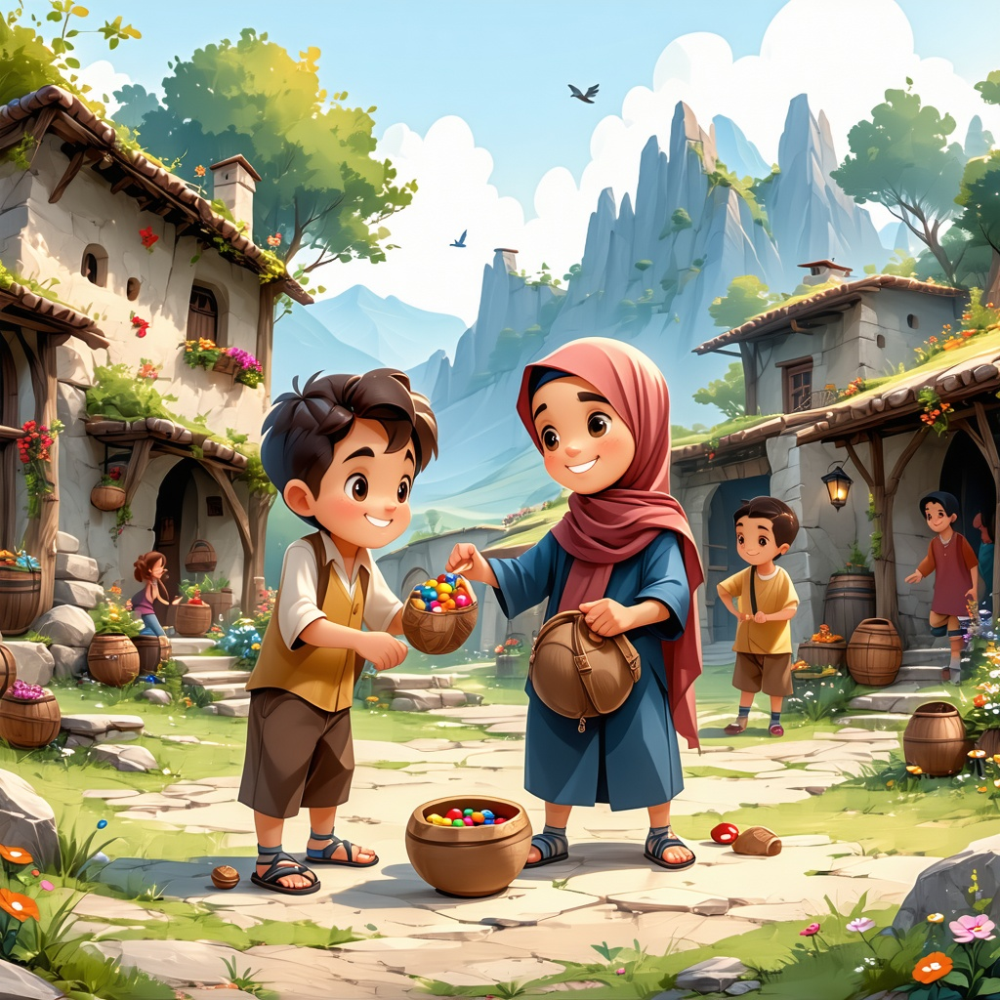

Enhanced prompt for scene 2:  In the idyllic village where young Muhammad resides, he struggles with not being able to partake in the act of sharing his possessions with his fellow villagers. One sunny afternoon, Muhammad joins his friends in participating in 'The Treasure Hunt Game,' which requires teamwork and cooperation amongst its players. During the course of the game, Muhammad realizes that certain kids lacked toys or resources to join in the merriment. This revelation prompts him to selflessly offer up his belongings, allowing these unfortunate souls to also take pleasure in the activities at hand. As a result of his altruistic actions, bonds within the community grow stronger, leading to increased camaraderie and friendship. Reflecting on his experiences, Muhammad discovers that sharing brings immense happiness while fostering deeper connections with those around him. From now onward, he embraces the virtue of sharing wholeheartedly, becoming an inspiration to others in the pr

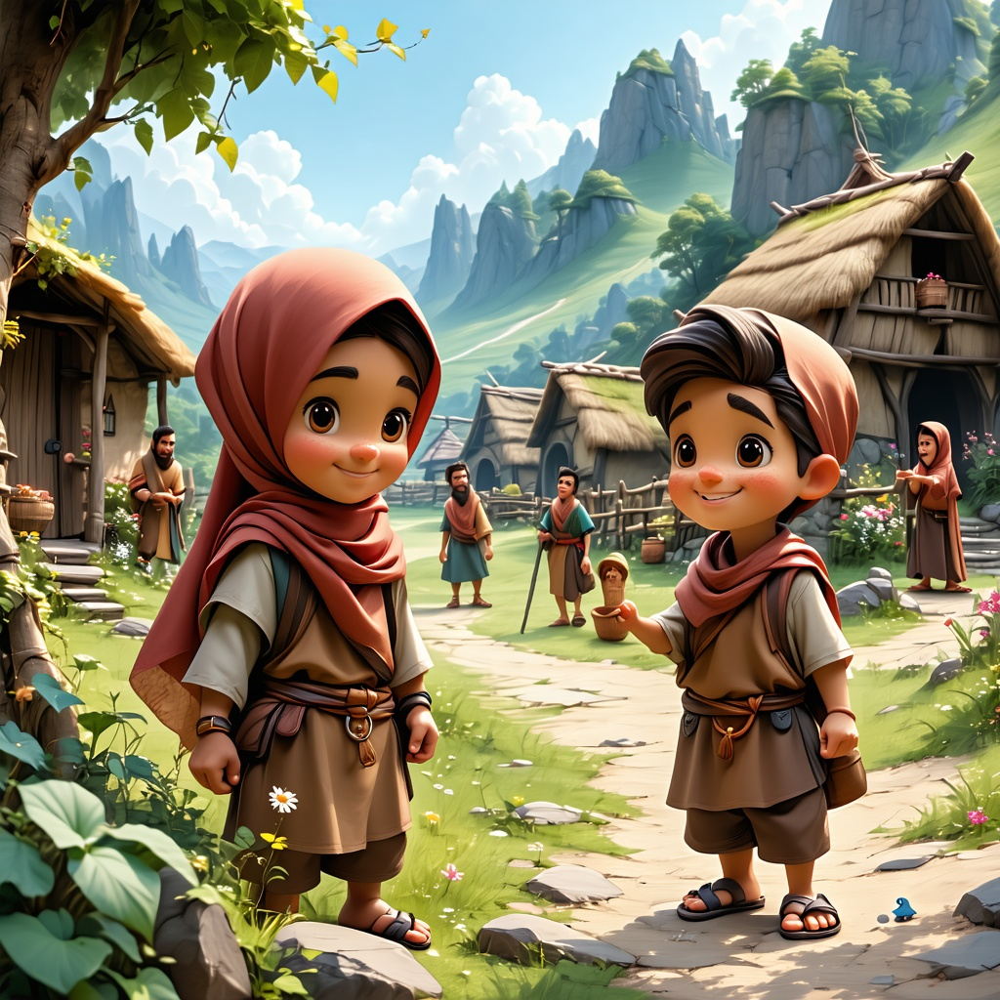

Enhanced prompt for scene 3:  In the idyllic village where young Muhammad resides, he struggles with not being able to partake in the act of sharing his possessions with his fellow villagers. One sunny afternoon, Muhammad joins his friends in participating in 'The Treasure Hunt Game,' which requires teamwork and cooperation amongst its players. During the course of the game, Muhammad realizes that certain kids lacked toys or resources to join in the merriment. This revelation prompts him to selflessly offer up his belongings, allowing these unfortunate souls to also take pleasure in the activities at hand. As a result of his altruistic actions, bonds within the community grow stronger, leading to increased camaraderie and friendship. Reflecting on his experiences, Muhammad discovers that sharing brings immense happiness while fostering deeper connections with those around him. From now onward, he embraces the virtue of sharing wholeheartedly, becoming an inspiration to others in the pr

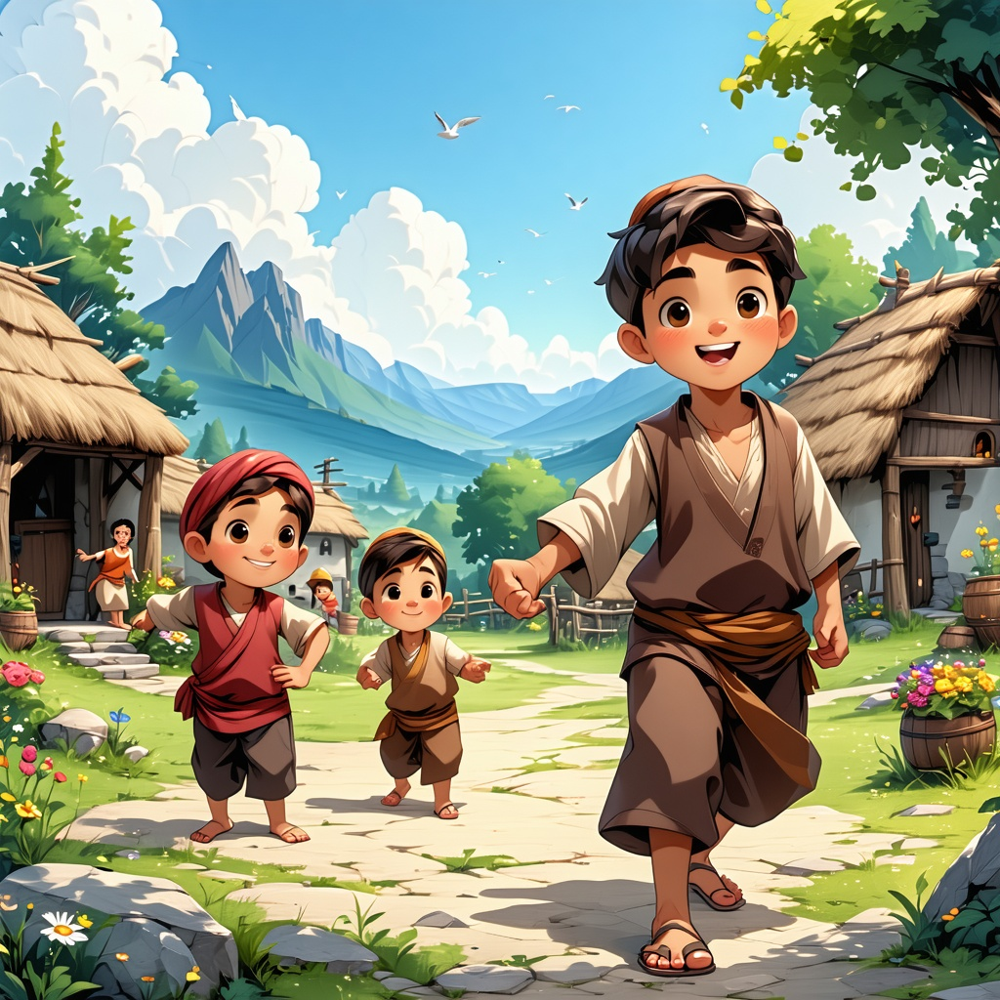

Enhanced prompt for scene 4:  In the idyllic village where young Muhammad resides, he struggles with not being able to partake in the act of sharing his possessions with his fellow villagers. One sunny afternoon, Muhammad joins his friends in participating in 'The Treasure Hunt Game,' which requires teamwork and cooperation amongst its players. During the course of the game, Muhammad realizes that certain kids lacked toys or resources to join in the merriment. This revelation prompts him to selflessly offer up his belongings, allowing these unfortunate souls to also take pleasure in the activities at hand. As a result of his altruistic actions, bonds within the community grow stronger, leading to increased camaraderie and friendship. Reflecting on his experiences, Muhammad discovers that sharing brings immense happiness while fostering deeper connections with those around him. From now onward, he embraces the virtue of sharing wholeheartedly, becoming an inspiration to others in the pr

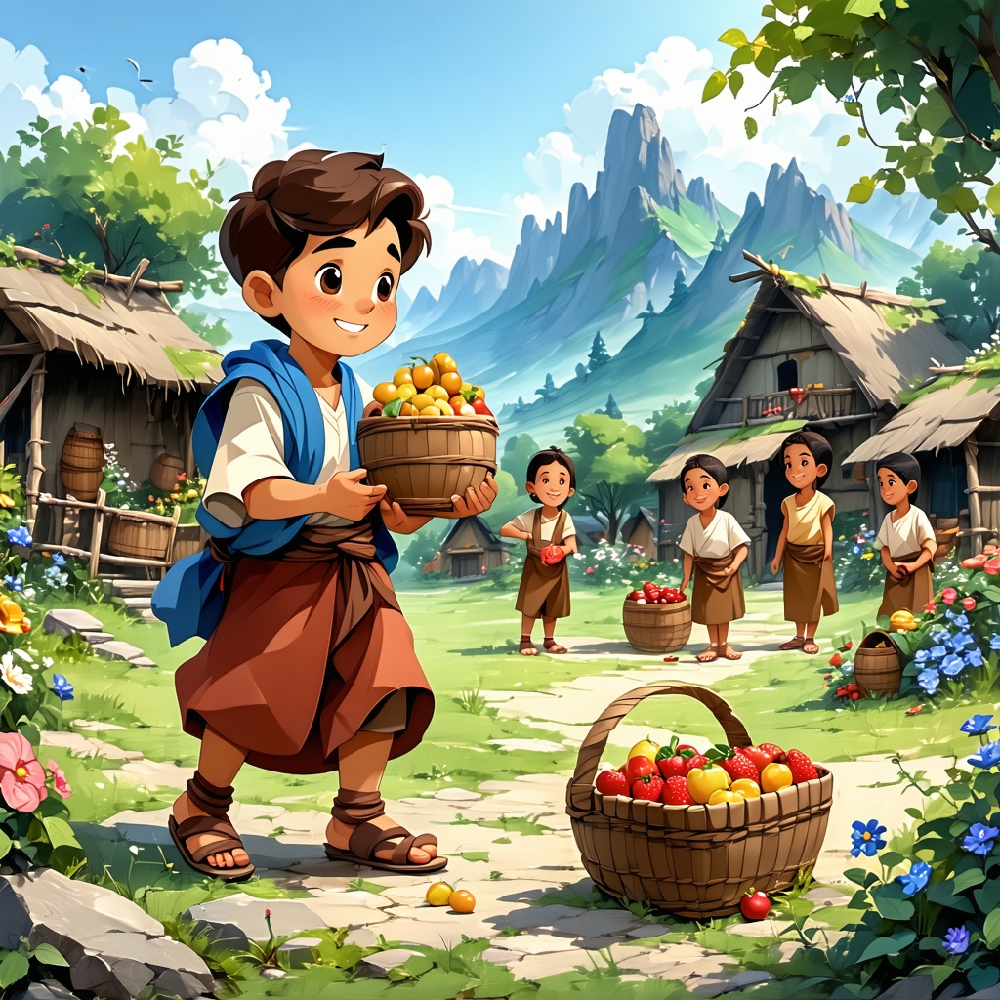

In [8]:
from ibm_cloud_sdk_core.authenticators import IAMAuthenticator
import requests
import json
import IPython.display
from PIL import Image

# IBM Allam Model Authentication
authenticator = IAMAuthenticator('OM4DsKtGi0BXrjk3Gp7u-IaYFwlo4grd_tTaUXF1ZZHI')
token = authenticator.token_manager.get_token()

# Allam API Headers
allam_headers = {
    "Accept": "application/json",
    "Content-Type": "application/json",
    "Authorization": f"Bearer {token}"
}
allam_url = "https://eu-de.ml.cloud.ibm.com/ml/v1/text/generation?version=2023-05-29"

# SD3 request
STABILITY_KEY = 'sk-gPLk09HWL9iofv3EuwXdc9HnMDt3Ej6dvTZVFS251rwKMHVc'
host = f"https://api.stability.ai/v2beta/stable-image/generate/sd3"

def send_generation_request(host, params):
    headers = {
        "Accept": "image/*",
        "Authorization": f"Bearer {STABILITY_KEY}"
    }

    # Prepare the parameters as a multipart form-data
    files = {
        "prompt": (None, params["prompt"]),
        "aspect_ratio": (None, params["aspect_ratio"]),
        "seed": (None, str(params["seed"])),
        "output_format": (None, params["output_format"]),
        "model": (None, params["model"]),
        "mode": (None, params["mode"])
    }

    response = requests.post(
        host,
        headers=headers,
        files=files  # Send as multipart/form-data
    )

    if not response.ok:
        raise Exception(f"HTTP {response.status_code}: {response.text}")

    return response


def generate_prompt(prompt_text):
    """Generate text using Allam Model."""
    body = {
        "input": f"<s> [INST] {prompt_text} [/INST]",
        "parameters": {
            "decoding_method": "greedy",
            "max_new_tokens": 1000,
            "repetition_penalty": 1.2
        },
        "model_id": "sdaia/allam-1-13b-instruct",
        "project_id": 'a63b4a9e-75df-4de5-b2d5-a2abe3d58e70'
    }
    response = requests.post(allam_url, headers=allam_headers, json=body)
    if response.status_code != 200:
        raise Exception(f"API Error: {response.status_code} - {response.text}")
    data = response.json()
    return data['results'][0]['generated_text']

def translate_to_english_allam(text):
    """Translate Arabic story to English using Allam."""
    translation_prompt = f"Translate the following story into English:\n\n{text}"
    return generate_prompt(translation_prompt)

def get_story_summary_english(story_text):
    """Generate an English summary of the story using Allam."""
    summary_prompt = f"Provide a summary of this story and give a cinematic description of the story scene and character and the character outfit :\n\n{story_text}"
    return generate_prompt(summary_prompt)

def evaluate_story_safety(story_text):
    """Evaluate if the story is safe for children and aligned with Islamic values using Allam."""
    safety_prompt = (
        f"Evaluate the following story for child safety and alignment with Islamic values. "
        "Provide feedback on whether it meets these standards. If it does not, suggest changes or specify it as unsafe:\n\n{story_text}"
    )
    try:
        safety_feedback = generate_prompt(safety_prompt)
        if "unsafe" in safety_feedback.lower() or "does not meet" in safety_feedback.lower():
            print("The story did not pass the safety check. Regenerating...")
            return False, safety_feedback
        else:
            print("The story passed the safety check.")
            return True, safety_feedback
    except Exception as e:
        print(f"Error evaluating story safety: {str(e)}")
        return False, "Error in safety evaluation."



def generate_images_for_scenes(english_story, story_summary, sentences_per_scene=4):
    """Split the story into scenes and generate images with improved context."""
    sentences = english_story.split(".")
    scenes = [".".join(sentences[i:i + sentences_per_scene]).strip() for i in range(0, len(sentences), sentences_per_scene) if sentences[i].strip()]

    for i, scene in enumerate(scenes):
        if not scene:
            continue
        enhanced_prompt = f"{story_summary} In this scene: {scene}. Make sure the style is consistent with previous images,  in an animated Arabic style."

        print(f"Enhanced prompt for scene {i + 1}: {enhanced_prompt}\n")

        params = {
            "prompt": enhanced_prompt,
            "aspect_ratio": "1:1",
            "seed": 0,
            "output_format": "jpeg",
            "model": "sd3.5-large",
            "mode": "text-to-image"
        }
        try:
            response = send_generation_request(host, params)
            output_image = response.content
            generated_filename = f"generated_scene_{i + 1}.jpeg"
            with open(generated_filename, "wb") as f:
                f.write(output_image)
            print(f"Saved image {generated_filename}")
            IPython.display.display(Image.open(generated_filename))
        except Warning as e:
            print(f"Scene {i + 1} generation was blocked: {str(e)}")
        except Exception as e:
            print(f"Error generating image for scene {i + 1}: {str(e)}")

def chatbot():
    """Main chatbot function to interact with the user."""
    greeting_prompt = (
        "انت نموذج ذكاء اصطناعي اسمك فسيلة، هدفك هو تعليم الاطفال اللغة العربية بطريقة القصص الممتعة والمفيدة"
        "قم بكتابة رسالة ترحيب دافئة للأب أو الأم، توضح أنك ستساعدهم في إنشاء قصة ممتعة وتعليمية "
        "لطفلهم حول قيمة أخلاقية أو سلوكية. اجعل التحية مريحة وداعمة، "
        "انهي القصة  بسوال موجهة للطفل عن القيمةالتي تعلمها من القصة"
    )

    try:
        greeting = generate_prompt(greeting_prompt)
        print(greeting)
    except Exception as e:
        print(f"حدث خطأ أثناء توليد التحية: {str(e)}")
        return

    child_name = input("ما هو اسم طفلك؟\n")
    value = input("\nما هي القيمة التي ترغب في أن يتعلمها طفلك من القصة؟\n")

    print("\nجارٍ إنشاء القصة...")

    story_prompt = (
        f"اكتب قصة تحتوي على اسم {child_name}، وتدور حول تعليم قيمة '{value}'. "
        "اجعل القصة مليئة بالأحداث المشوقة والشخصيات المحببة للأطفال، مع نهاية مشجعة."
        "اعطني عنوان جذاب للقصة يتضمن اسم الطفل والقيمة المضافة"
        "تفاعل مع الطفل واسئلة ماذا تعلم من هذه القصة"
    )

    try:
        story = generate_prompt(story_prompt)
        print("\nهذه هي القصة التي أنشأتها:\n")
        print(story)
    except Exception as e:
        print(f"حدث خطأ أثناء إنشاء القصة: {str(e)}")
        return
# Evaluate the story's safety
    is_safe, feedback = evaluate_story_safety(story)
    if not is_safe:
        try:
            print("\nRegenerating the story based on feedback...")
            story = generate_prompt(story_prompt)  # Re-generate the story
            print("\nRegenerated story:\n")
            print(story)
            # Re-evaluate if necessary
            is_safe, feedback = evaluate_story_safety(story)
            if not is_safe:
                print("The regenerated story still did not meet safety standards. Please adjust the input or try again.")
                return
        except Exception as e:
            print(f"Error re-generating the story: {str(e)}")
            return

    print("\nFinal story after safety check:\n")
    print(story)

    # Translate the story to English
    try:
        english_story = translate_to_english_allam(story)
        print("\nTranslated story for image generation:\n")
        print(english_story)
    except Exception as e:
        print(f"Error translating the story: {str(e)}")
        return

     # Generate a summary of the story in English
    try:
        story_summary = get_story_summary_english(english_story)
        print("\nGenerated story summary in English:\n")
        print(story_summary)
    except Exception as e:
        print(f"Error generating the story summary: {str(e)}")
        return

    # Generate images for each scene
    print("\nGenerating images for story scenes...")
    generate_images_for_scenes(english_story, story_summary)

# Run the chatbot
if __name__ == "__main__":
    chatbot()
